# Automatic delineation of field boundaries on satellite images


In [ ]:
# https://github.com/thimabru1010/ResUnet-a_mltsk_keras

In [1]:
# Mount google drive folder
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
!pip install geopandas
!pip install rasterio
!pip install pandas fiona shapely pyproj rtree
!pip install mxnet-cu110
!pip install gluoncv
!pip install higra
!pip install pycm


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 6.7 MB/s 
     |████████████████████████████████| 6.3 MB 12.8 MB/s 
     |████████████████████████████████| 16.7 MB 35.7 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 19.3 MB 88 kB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 7.9 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 327.3 MB 6.3 kB/s 
  Attempting uninstall: graphviz
    Found existing installation: graphviz 0.10.1
    Uninstalling graphviz-0.10.1:
      Successfully uninstalled graphviz-0.10.1
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/sim

In [3]:
import os
import numpy as np
import sys
import typing
from osgeo import gdal
#import gdal
import geopandas as gpd

# import tensorflow as tf
import cv2
import rasterio

from tqdm import tqdm

from shapely.geometry import Polygon
from rasterio import features
from rasterio.features import rasterize

from mxnet import nd 
from mxnet import autograd,optimizer,gluon
import mxnet as mx
import warnings
import logging
from pycm import *
from skimage import exposure
# %cd "/content/drive/My Drive/Colab Notebooks/"

BASE_PATH = r"/content/drive/My Drive/Colab Notebooks/Data_Struct_Model"
INPUT_PATH = BASE_PATH
OUTPUT_PATH = BASE_PATH + "/Networks"
IMAGE_PATH = ""
LABEL_PATH = "/Labels"

INCLUDE_FOLDERS = ["aoi1", "aoi2", "aoi3", "aoi4", "aoi5", "aoi6", "aoi7", "aoi8", "aoi9"]

print(INPUT_PATH)

/content/drive/My Drive/Colab Notebooks/Data_Struct_Model


### For each AOI, create the boundary and the extent mask*

Only boundary mask is needed to show the AOI along with the known field boundaries (which are in the shp files for that AOI). The code below is the same used for calculating boundary and extent masks from shp files.

In [4]:
for folder in INCLUDE_FOLDERS:

    input_path = BASE_PATH + "/" + folder + "/" +folder
    shp_file = BASE_PATH + "/" + folder + "/" + 'shape_'+ folder +'_crs_adj/' + 'shape_'+ folder +'_crs_adj' + ".shp"
    df = gpd.read_file(shp_file)

    if folder in ['aoi1', 'aoi2', 'aoi3']:
        df =  df.to_crs(32643)
    else:
        df =  df.to_crs(32644)
    
    tif_data = gdal.Open(input_path + ".tiff")
    ulx, xres, xskew, uly, yskew, yres  = tif_data.GetGeoTransform()
        
    lrx = ulx + ((tif_data.RasterXSize+1) * xres) # expand the extent boundaries by 1 pixel
    lry = uly + ((tif_data.RasterYSize+1) * yres) # needed so that we don't close the polygons on the top
    ulx -= xres                                   # and left of the tif file
    uly -= yres

    img_bbox1 = Polygon([(ulx, uly), (ulx, lry), (lrx, lry), (lrx, uly)]) 
    bbox_gdf1 = gpd.GeoDataFrame({'geometry': [img_bbox1]}, crs=df.crs)   
    farms = gpd.overlay(df, bbox_gdf1, how='intersection')
    # farms_eroded = farms['geometry'].apply(lambda x: x.buffer(-3)) # only for extent mask
        
    # fig, ax = plt.subplots(1,1, figsize=(10,10))
    # farms_eroded.plot(ax=ax, cmap ='viridis')
    # plt.show()

    lst_exterior = []
    for farm in farms['geometry']:
        if not isinstance(farm, Polygon): # multi-polygon
            allparts = [p.buffer(0) for p in farm.geoms]
            for part in allparts:
                lst_exterior.append(gpd.geoseries.GeoSeries(part.exterior)[0])
        else:
            lst_exterior.append(gpd.geoseries.GeoSeries(farm.exterior)[0])
    farms_exterior = gpd.geoseries.GeoSeries(lst_exterior)
        
    xcoord = [ulx+xres, ulx+xres, lrx-xres, lrx-xres, ulx+xres] # go back to 800x800 tif
    ycoord = [uly+yres, lry-yres, lry-yres, uly+yres, uly+yres]
    inp_poly = Polygon(zip(xcoord, ycoord))
    farms_exterior = farms_exterior.intersection(inp_poly)

    output_label_path = BASE_PATH + "/" + folder + "/" + LABEL_PATH
    if not os.path.isdir(output_label_path):
        os.mkdir(output_label_path)
        
    out_fn = output_label_path + "/extent_" + folder + '.tiff'  # the name of output mask image

    # read the input raster
    ras = rasterio.open(input_path + ".tiff")
    # copy the metadata of the input raster which will be used to create the output raster
    meta = ras.meta.copy()
    # print(meta)
    meta.update(compress='lzw')
    meta.update(count=1)
    meta.update(dtype='uint8') # this is the key to showing pixels when you click on the file name
    meta.update(nodata=None) # in Overijssel tif files, nodata='-32768'

    #Rasterize the polygons by burning them to the input raster and write the mask tif
    with rasterio.open(out_fn, 'w+', **meta) as out:
        out_arr = out.read(1)
        shapes = farms.geometry.values
        burned = features.rasterize(shapes=shapes, fill=0, out=out_arr, default_value=255, transform=out.transform)
        out.write_band(1, burned)


### Load the tiff files, setup labels*

Only labels for boundary is needed for this notebook.

In [5]:
from collections import defaultdict
# ################################################################
# Loading input data
#
# Input data is loaded into two dictionaries: 
#
# images: contains the 4-band images. The values are loaded as ints.
# labels: contains 3D arrays in which each pixel is assigned with 
#         a label "1" = other and "2" = field boundary
#
# ################################################################

farmhand = True  #creates a custom masks suited for farmhand data as all the plots in the image were not labelled

def key_generator(file_name):
    """Generates the key of a file based on the file name. The resulting key is
    a tuple of the province as string & the file number index as int,
    e.g. ("gelderland", 29)
    """
    file_name = file_name.lower()
    file_name = file_name.replace(".tiff", "")
    return (file_name)

def gtiff_to_array(file_path):
    """Takes a file path and returns a tif file as a 3-dimensional numpy array, width x height x bands."""
    # data = gdal.Open(file_path)
    # bands = [data.GetRasterBand(i+1).ReadAsArray() for i in range(data.RasterCount)]
    with rasterio.open(file_path,mode='r') as src1:
            img = src1.read()
    img =(img/img.max())*255
    # img= img.astype('uint8')
    return img.transpose(1,2,0) #np.stack(bands, axis=2)

def transform_classification_image(input):
    """Takes the classification image input (in RGB format as 3D array) and 
    creates a 2D array out of this. The innermost array expects either values of
    [0, 0, 0] of [255, 255, 255] since this is the colouring we assigned to the
    classified images.

    :param input: 3D input image (classification)
    :return: 2D array image with labels 1 for 'other' and 2 for 'field_boundaries'
    """

    # Out of the 3D input array it takes the "max" element out of the array
    # This will either be 0 or 255. This function is just called to transform 
    # the 3D array to a 2D array.
    result = np.reshape(np.max(input, axis=2), (input.shape[0], input.shape[1], 1))

    # Now the array consists of pixels with values "0" or "255". We transform
    # each value, that is larger than 0 (i.e. 255) and assign the label "2" to
    # it. Each other element (i.e. 0) will get assigned the label "1".
    result = np.where(result > 0, 2, 1)
    return result

def to_categorical_3d(y: np.ndarray, nc: int):
    Y = np.zeros((y.shape[0], y.shape[1], nc), dtype='uint8')
    # Activating labels
    # Label 1 = other
    Y[:, :, 0] = np.where(y[ :, :, 0] == 1, 1, 0) # y shape 800x800x1
    # Label 2 = field boundaries
    Y[:, :, 1] = np.where(y[ :, :, 0] == 2, 1, 0)
    return Y

def get_partial(labels, _kernel_size = (3,3)):
    num_layers = labels.shape[2]
    label = labels.copy()
    for channel in range(num_layers):
        label[:,:,channel] = cv2.dilate(label[:,:,channel], cv2.getStructuringElement(cv2.MORPH_CROSS,_kernel_size) ,iterations = 1)
    label = label.astype(np.uint8)
    return label

def get_boundary(labels, _kernel_size = (3,3)):

    label = labels.copy()
    num_layers = labels.shape[2]
    for channel in range(num_layers):
        label[:,:,channel] = cv2.Canny(label[:,:,channel],0,1)
    label = label.astype(np.float32)
    label /= 255.
    label = label.astype(np.uint8)
    return label

def get_distance(labels):
    label = labels.copy()
    num_layers = labels.shape[2]
    dists = np.empty_like(label,dtype=np.float32)
    for channel in range(num_layers):
        dist = cv2.distanceTransform(label[:,:,channel], cv2.DIST_L2, 0)
        dist = cv2.normalize(dist, dist, 0, 1.0, cv2.NORM_MINMAX)
        dists[:,:,channel] = dist

    dists = dists * 100.
    dists = dists.astype(np.uint8)
    return dists

# Dictionaries which contain the input data
images = {}
labels = defaultdict(dict)

# Iterate through defined folders and load all image data into the dictionaries
# image_data and label_data. Images can be accessed with (<province>, <index>)
for folder in INCLUDE_FOLDERS:
    input_path = INPUT_PATH + "/" + folder
    original = input_path + "/" + folder + ".tiff"
    value = gtiff_to_array(original)
    key = key_generator(folder)
    images[key] = value.astype('float32')
        
    for f in os.listdir(input_path + "/Labels"): 
        # inner_key = 'extent'
        # if not f.startswith('extent'): # extent
        if f.startswith('extent'): # boundary
            inner_key = 'extent'

            extent_map = gtiff_to_array(input_path + "/Labels/" + f) 

            # Transform the classification image from RGB to labels "1" and "2"
            # if inner_key != 'dist':
            #     value = transform_classification_image(value)
            extent_map = transform_classification_image(extent_map)
            extent_map = to_categorical_3d(extent_map, 2)
            
            # labels[key]['dist'] = get_distance(extent_map)
            bounds_map = get_boundary(extent_map)
            if farmhand:
              extent_map_cp = extent_map  #create copy of extent mask
              extent_map_cp[:,:,0] = extent_map[:,:,1] # Replicate the layer 1 of extent mask for layer 0 as well
              partial_map = get_partial(extent_map_cp) # Run through the get_partial function to create a binary partial mask that covers extent and boundary area of field
              extent_map[:,:,0] = bounds_map[:,:,1] #copy distance mask as non-field extent mask for farm hand data
              bounds_map[:,:,0] = np.zeros_like(bounds_map[:,:,0])
              # bounds_map = get_boundary(tmask_label_1h) #tmask_label_1h Apply the boundary mask function on the new extent mask
              distance_map = get_distance(extent_map) #get distance mask
              # tlabels_all = np.concatenate([tmask_label_1h, bounds_map, distance_map, partial_map],axis=0)

              labels[key]['mask'] = partial_map
            else:
              distance_map = get_distance(extent_map)

            labels[key][inner_key] = extent_map
            labels[key]['dist'] = distance_map
            labels[key]['bound'] = bounds_map
            


print(f"Shape of sample image file: {list(images.values())[0].shape}")
# print(f"Shape of sample label file: {list(labels.values())[0].shape}")
print(f"Shape of sample label extent file: {list(labels.values())[0]['extent'].shape}")
print(f"Shape of sample label boundary file: {list(labels.values())[0]['bound'].shape}")
print(f"Shape of sample label distance file: {list(labels.values())[0]['dist'].shape}")


print(f"Total number of image & label tiles: {len(images)}")



Shape of sample image file: (1447, 1063, 4)
Shape of sample label extent file: (1447, 1063, 2)
Shape of sample label boundary file: (1447, 1063, 2)
Shape of sample label distance file: (1447, 1063, 2)
Total number of image & label tiles: 9


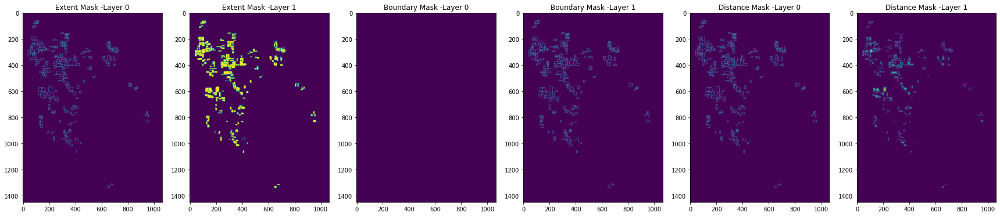

In [6]:
#Visualize the masks created
import matplotlib.pyplot as plt

fig, ax =plt.subplots(1,6, figsize=(30,30))
ax[0].imshow(list(labels.values())[0]['extent'][:,:,0])
ax[1].imshow(list(labels.values())[0]['extent'][:,:,1])
ax[2].imshow(list(labels.values())[0]['bound'][:,:,0])
ax[3].imshow(list(labels.values())[0]['bound'][:,:,1])
ax[4].imshow(list(labels.values())[0]['dist'][:,:,0])
ax[5].imshow(list(labels.values())[0]['dist'][:,:,1])
ax[0].set_title("Extent Mask -Layer 0")
ax[1].set_title("Extent Mask -Layer 1")
ax[2].set_title("Boundary Mask -Layer 0")
ax[3].set_title("Boundary Mask -Layer 1")
ax[4].set_title("Distance Mask -Layer 0")
ax[5].set_title("Distance Mask -Layer 1")
plt.show()

In [8]:

# ################################################################
# Normalizing images
# 
# Normalizing all input images into values in the interval [0, 1].
# All bands are normalized seperately, which means, the min & max
# of each band is calculated based on each band of the image data.
# ################################################################

# def normalize(img):

#         temp = img.astype(np.float32)
#         temp2 = temp.T            
#         temp2 -= mean
#         temp2 /= std
            
#         temp = temp2.T

#         return temp

# def normalize(val, min, max):
#     """Normalizes the value of a single pixel. Takes into account the minimum,
#     and maximum value.

#     v_normalized = (v - min) / (max - min)

#     :param val: integer value
#     :param min: integer minimum
#     :param max: integer maximum
#     :return: single floating point number in [0, 1]
#     """
#     # TODO: check if necessary, otherwise delete
#     return (val - min) / (max - min)

mean = np.array([35.62046,  41.339233, 32.118134, 90.02198 ])  ##Normalization constants calculated from training datset
std = np.array ([45.244064, 49.484463, 34.908585, 54.91547])

# mean = np.array([45.45052,  46.851467, 38.638863, 73.885 ])
# std = np.array ([57.32448,  57.22822,  49.759693, 71.27414])

def normalize_watershed(arr):
    """Takes a 3D array as input, iterates over the bands and normalizes those.

    :param arr: input array (original image data) 
    :return: normalized data with values between 0 and 1
    """
    arr_norm = np.zeros(arr.shape, dtype=np.float32)
    mn = arr[arr!=0].min()
    mx = arr[arr!=0].max()

    arr_norm = (arr - mn) / (mx - mn)
    arr_norm[arr_norm<=0]=0
#         arr_norm = (arr - mn) / (mx - mn) # original code
    
    return arr_norm

def normalize_array(arr):
    """Takes a 3D array as input, iterates over the bands and normalizes those.

    :param arr: input array (original image data) 
    :return: normalized data with values between 0 and 1
    """
    arr_norm = np.zeros(arr.shape, dtype=np.float32)

    for i in range(arr.shape[2]):
        mn = mean[i]
        st = std[i]

        arr_norm[:, :, i] = (arr[:, :, i] - mn) / (st)
#         arr_norm = (arr - mn) / (mx - mn) # original code
    
    return arr_norm

def restore(arr):
    arr_res = np.zeros(arr.shape, dtype=np.float32)

    
    for i in range(arr.shape[2]):
        mn = mean[i]
        st = std[i]

        # arr_norm[:, :, i] = (arr[:, :, i] - mn) / (st)
        arr_res[:, :, i] = (arr[:, :, i] * st) +mn
        # d2 = d2.T
    # arr_res = np.round(arr_res)
    # arr_res = arr_res.astype('uint8')

    return arr_res 

for k, v in tqdm(images.items()):
    # images[k] = normalize_array(v)
    images[k] =normalize_array(v)
    #print(f"Performed normalization of {k[0]}_{k[1]}")


100%|██████████| 9/9 [00:00<00:00, 39.96it/s]


## Helper functions to visualize labels, images

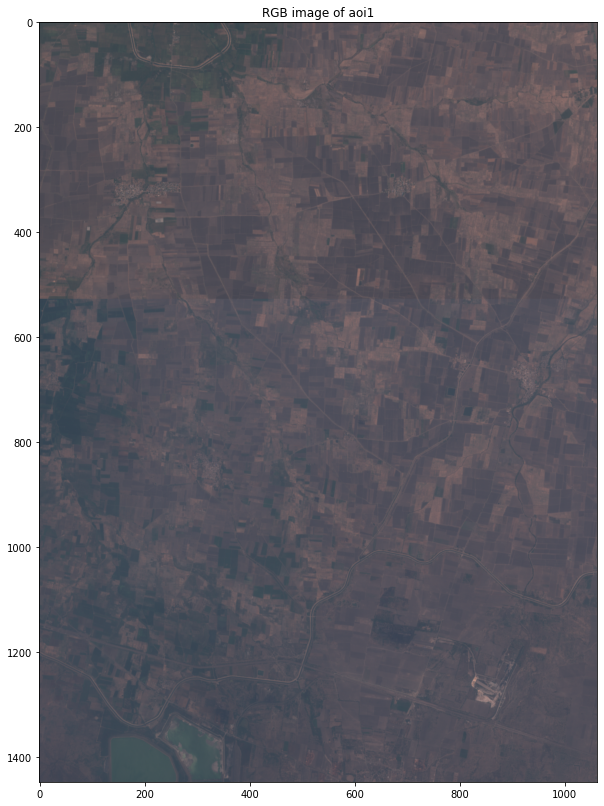

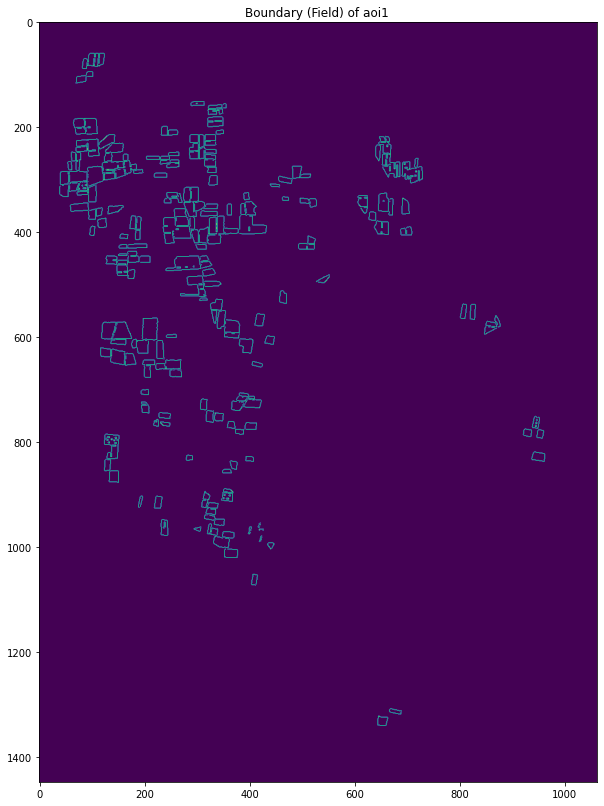

In [9]:
# ################################################################
# Visualize some sample input data
#
# Helps to verify that the data is correct and also supports the
# thinking process if trying to debug the program.
# ################################################################

from matplotlib import patches, pyplot


def visualize_labels(arr, title):
    fig = pyplot.figure(figsize=(10,15))

    a = fig.add_subplot(1, 1, 1)
    a.set_title(title)

    values = np.unique(arr.ravel()) # flattened array

    im = pyplot.imshow(arr[:, :, 1]) # imshow(arr[:, :, 0] for non-field

def visualize_dist(arr, title):
    fig = pyplot.figure(figsize=(10,15))

    a = fig.add_subplot(1, 1, 1)
    a.set_title(title)

    im = pyplot.imshow(arr[:, :, 1]) # imshow(arr[:, :, 0] for non-field

def visualize_data(arr, title):
    """Visualize the satellite image data.
    
    :param arr: Input image (4 bands, the first 3 will be printed)
    :param title: Title of the plot
    """
    # Switching bands:
    #     blue green red
    #     red  green blue
    data = restore(arr[:, :, 0:-1].copy()) # 3 out of the 4 channels; NOTE: copy of arr
    # red = data[:, :, 0].copy()
    # data[:, :, 0] = data[:, :, 2]
    # data[:, :, 2] = red
    # Should be already the case if normalization is included
    # data = data.astype(np.float32)
    data = data.astype('uint8')

    # perform stretching for better visualization
#     for i in range(data.shape[2]):
#         p2, p98 = np.percentile(data[:, :, i], (2, 98))
#         data[:, :, i] = exposure.rescale_intensity(data[:, :, i],
#                                                       in_range=(p2, p98))
    fig = pyplot.figure(figsize=(10,15))
    a=fig.add_subplot(1,1,1)
    a.set_title(title)
    pyplot.imshow(data)

# CHANGE THIS KEY TO CHOOSE A DIFFERENT AOI
key = "aoi1"

# Uncomment below to see the original image

visualize_data(images[key], f"RGB image of {key}")
visualize_labels(labels[key]['bound'], f"Boundary (Field) of {key} ")
# visualize_labels(labels[key]['extent'], f"Extent (Field) of {key} ")
# visualize_dist(labels[key]['dist'], f"Distance (Field) of {key} ")

## Helper functions to plot the image together with the field boundaries

In [10]:
def get_data_w_bound(arr, bound):
    """Visualize the satellite image data.
    
    :param arr: Input image (4 bands, the first 3 will be printed)
    :param title: Title of the plot
    """
    # Switching bands:
    #     blue green red
    #     red  green blue

    data = restore(arr[:, :, 0:-1].copy()) # 3 out of the 4 channels; NOTE: copy of arr
    # red = data[:, :, 0].copy()
    # data[:, :, 0] = data[:, :, 2]
    # data[:, :, 2] = red

    # Should be already the case if normalization is included
    # data = data.astype(np.float32)
    data = data.astype('uint8')
    
    condition = bound[:,:,1] >= 1
    data[condition] = [0.,0.,0.]
#     for i in range(arr.shape[0]):
#         for j in range(arr.shape[1]):
#             if bound[i,j,1]:
#                 data[i,j,:] = [0.,0.,0.]

    return data

In [11]:
def calculate_savi_w_bound(arr, bound):
    """ Calculate SAVI 
    Javascript code from Sentinel documentation converted to Python
    https://custom-scripts.sentinel-hub.com/custom-scripts/sentinel-2/savi/#
    """

    # b08_idx = 3
    # b04_red_idx = 2
    # b02_blue_idx = 0
    data = restore(arr[:, :, :].copy())
    L = 0.428
    savi = (data[:,:,3] - data[:,:,2]) / (data[:,:,3] + data[:,:,2] + L) * (1.0 + L); # calculate savi index

    # Should be already the case if normalization is included
    savi = savi.astype(np.float32)
    pdata = np.zeros(shape=(arr.shape[0], arr.shape[1], 3))
    num_chilli_pixels = 0
    
    for i in range(arr.shape[0]):
        for j in range(arr.shape[1]):
            if bound[i,j,1]:
                pdata[i,j] = [0,0,0]
            elif (savi[i,j] <-1):
                pdata[i,j] = [1,1,1]; # white color for values less than -1
            elif (savi[i,j] <0):
                pdata[i,j] = [0.69,0.88,0.901]; # blue color majorly water
            elif (savi[i,j] <0.09):
                pdata[i,j] = [0.74,0.72,0.42];  
            elif (savi[i,j] <0.1):
                pdata[i,j] = [0.64,0.8,0.35]; 
            elif (savi[i,j] <0.2):
                pdata[i,j] = [0.57,0.75,0.32];
            elif (savi[i,j] <0.3):
                pdata[i,j] = [0.60,0.80,0.19];
            elif (savi[i,j] <0.4):
                pdata[i,j] = [0.13,0.63,0.13];
            elif (savi[i,j] <0.5):
                pdata[i,j] = [0.13,0.55,0.13];
            elif (savi[i,j] <0.6):
                pdata[i,j] = [0,0.50,0];
                num_chilli_pixels += 1
            elif (savi[i,j] <0.7):
                pdata[i,j] = [0,0.39,0];
                num_chilli_pixels += 1
            elif (savi[i,j] <1):
                pdata[i,j] = [0, 0.29,0]; 
                num_chilli_pixels += 1
            else:
                pdata[i,j] = [0,0,0];

    return pdata, num_chilli_pixels

def calculate_evi_w_bound(arr, bound):
    """Calculate EVI
    Javascript code from Sentinel documentation converted to Python
    """

    # b08_idx = 3
    # b04_red_idx = 2
    # b02_blue_idx = 0
    data = restore(arr[:, :, :].copy())
    evi = 2.5 * (data[:,:,3] - data[:,:,2]) / ((data[:,:,3] + 6*data[:,:,2] - 7.5*data[:,:,0]) + 1)

    # Should be already the case if normalization is included
    evi = evi.astype(np.float32)
    pdata = np.zeros(shape=(arr.shape[0], arr.shape[1], 3))
    
    for i in range(arr.shape[0]):
        for j in range(arr.shape[1]):
            if bound[i,j,1]:
                pdata[i,j] = [0,0,0]
            elif (evi[i,j] < -1.1):
                pdata[i,j] = [0,0,0]
            elif (evi[i,j] < -0.2):
                pdata[i,j] = [0.75,0.75,1]
            elif (evi[i,j] < -0.1):
                pdata[i,j] = [0.86,0.86,0.86]
            elif (evi[i,j] < 0):
                pdata[i,j] = [1,1,0.88]
            elif (evi[i,j] < 0.025):
                pdata[i,j] = [1,0.98,0.8]
            elif (evi[i,j] < 0.05):
                pdata[i,j] = [0.93,0.91,0.71]
            elif (evi[i,j] < 0.075):
                pdata[i,j] = [0.87,0.85,0.61]
            elif (evi[i,j]<0.075):
                pdata[i,j] = [0.87,0.85,0.61]
            elif (evi[i,j]<0.1):
                pdata[i,j] = [0.8,0.78,0.51]
            elif (evi[i,j]<0.125):
                pdata[i,j] = [0.74,0.72,0.42]
            elif (evi[i,j]<0.15):
                pdata[i,j] = [0.69,0.76,0.38]
            elif (evi[i,j]<0.175):
                pdata[i,j] = [0.64,0.8,0.35]
            elif (evi[i,j]<0.2):
                pdata[i,j] = [0.57,0.75,0.32]
            elif (evi[i,j]<0.25):
                pdata[i,j] = [0.5,0.7,0.28]
            elif (evi[i,j]<0.3):
                pdata[i,j] = [0.44,0.64,0.25]
            elif (evi[i,j]<0.35): 
                pdata[i,j] = [0.38,0.59,0.21]
            elif (evi[i,j]<0.4):
                pdata[i,j] = [0.31,0.54,0.18]
            elif (evi[i,j]<0.45):
                pdata[i,j] = [0.25,0.49,0.14]
            elif (evi[i,j]<0.5):
                pdata[i,j] = [0.19,0.43,0.11]
            elif (evi[i,j]<0.55):
                pdata[i,j] = [0.13,0.38,0.07]
            elif (evi[i,j]<0.6):
                pdata[i,j] = [0.06,0.33,0.04]
            else:
                pdata[i,j] = [0,0.27,0]
    return pdata

Total pixels:  1538161
Num chilli pixels:  11546


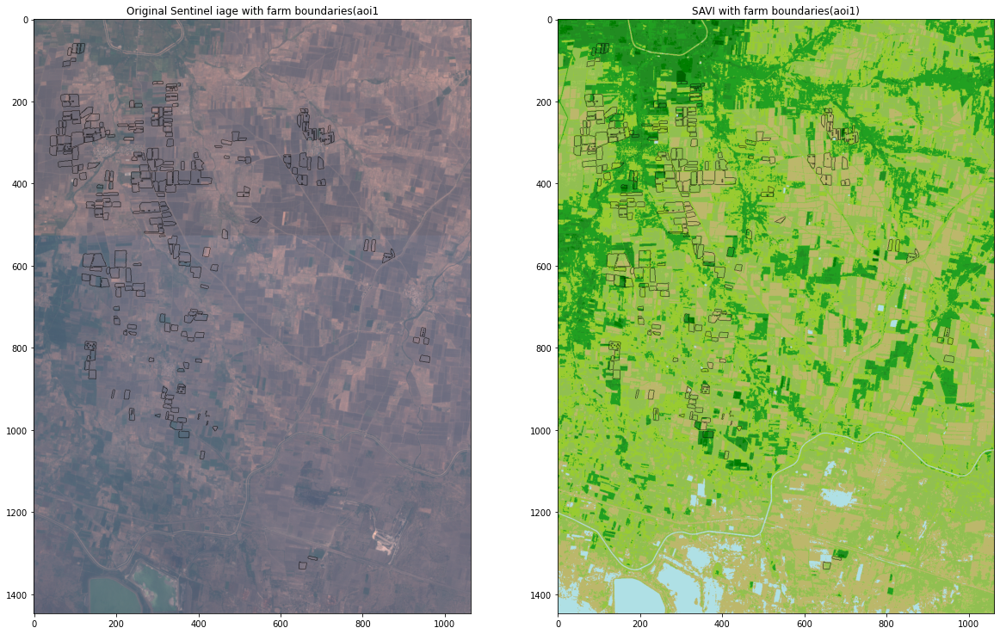

In [12]:
pdata_rgb = get_data_w_bound(images[key], labels[key]['bound'])
pdata_rgb =np.minimum(pdata_rgb * (5.5/1e3), 1)[:,:,:3] #change the multiplier to adjust the image brightness 
fig = pyplot.figure(figsize=(20, 15))
a=fig.add_subplot(1,2,1)
a.set_title(f'Original Sentinel iage with farm boundaries({key}')
pyplot.imshow(pdata_rgb)

a=fig.add_subplot(1,2,2)
pdata, num_chilli_pixels = calculate_savi_w_bound(images[key], labels[key]['bound'])
print("Total pixels: ", images[key].shape[0]*images[key].shape[1])
print("Num chilli pixels: ", num_chilli_pixels)
a.set_title(f'SAVI with farm boundaries({key})')
pyplot.imshow(pdata);

In [13]:
def extract_patches(image, patch_size):

    x = image.shape[0] // patch_size
    y = image.shape[1] // patch_size

    if image.shape[0]%patch_size != 0:
        x += 1
    if image.shape[1]%patch_size != 0:
        y += 1

    patches = np.zeros(
        shape=(0, patch_size, patch_size, image.shape[2]),
        dtype=image.dtype
    )
    for row in range(x):
        srow = row*patch_size
        erow = (row+1)*patch_size
        if erow >= image.shape[0]:
            erow = image.shape[0]
            srow = erow-patch_size
        for col in range(y):
            scol = col*patch_size
            ecol = (col+1)*patch_size
            if ecol >= image.shape[1]:
                ecol = image.shape[1]
                scol = ecol-patch_size
            # create patch, expand the dimension and add it to the samples
            patch = image[srow : erow, scol : ecol, :]
            patch = np.expand_dims(patch, axis=0)
            patches = np.concatenate((patches, patch), axis=0)    

    return patches

PATCHSIZE = 128

Define Evaluation Metric:

In [26]:
class eval_metric(object):
    """
    Here NClasses = 2 by default, for a binary segmentation problem in 1hot representation
    """

    def __init__(self,depth=0, NClasses=2):


        self.skip = NClasses

    def score(self,ground,outputs,NClasses=2, farmhand=False):

        
        if farmhand:
            pred_seg_new  =np.multiply(outputs[0], ground[3])
            pred_bound_new  = np.multiply(outputs[1], ground[3])
            pred_dists_new  = np.multiply(outputs[2], ground[3])

            pred_segm  = np.argmax(pred_seg_new, axis=2).flatten()
            pred_bound = np.argmax(pred_bound_new, axis=2).flatten()
            pred_dists = np.argmax(pred_dists_new, axis=2).flatten()

        else:

            pred_segm  = np.argmax(outputs[0], axis=2).flatten()
            pred_bound = np.argmax(outputs[1], axis=2).flatten()
            pred_dists = np.argmax(outputs[2], axis=2).flatten()

        # In our implementation of the labels, we stack together the [segmentation, boundary, distance] labels,
        # along the channel axis.
        # reshaping labels
        label_segm  = np.argmax(ground[0], axis=2).flatten()
        label_bound = np.argmax(ground[1], axis=2).flatten()
        label_dists = np.argmax(ground[2], axis=2).flatten()


        # metric calculation
        cm_segm = ConfusionMatrix(label_segm,pred_segm,digit=3)
        cm_bound = ConfusionMatrix(label_bound,pred_bound,digit=3)
        cm_dists = ConfusionMatrix(label_dists,pred_dists,digit=3)
        print(cm_segm.MCC)

        # print ("Segment F1 score : " , cm_segm.F1, "Boundary F1 score : ", cm_bound.F1)
        segm_f1 =sum([cm_segm.F1[f] for f in range(NClasses)])/NClasses
        segm_acc =sum([cm_segm.ACC[f] for f in range(NClasses)])/NClasses
        try:
          segm_mcc =sum([cm_segm.MCC[f] for f in range(NClasses)])/NClasses
        except:
          segm_mcc =0

        return segm_f1, segm_acc, segm_mcc
    

no_cuda=False

if not no_cuda:
    # Disable CUDA if there are no GPUs.
    if mx.context.num_gpus() == 0:
        no_cuda = True

class eval_metric(object):
    """
    Here NClasses = 2 by default, for a binary segmentation problem in 1hot representation
    """

    def __init__(self,depth=0, NClasses=2):


        self.skip = NClasses

    def cf_attr(self,ground,outputs,NClasses=2):

            pred_ext_new  = np.multiply(outputs[0], ground[3])
            ext_g_n=ground[0][:,:,0]
            ext_g_p=ground[0][:,:,1]
            ext_p_n=pred_ext_new[:,:,0]
            ext_p_p=pred_ext_new[:,:,1]
          
            def custom_metric_tp_extent(ext_g_p, ext_p_p,ext_g_n, ext_p_n):
                            
              pred_extent = (ext_p_p> ext_p_n)*1
              pred_extent =pred_extent.astype('float32')
              pred_extent *= ext_g_p
              tp = np.sum(pred_extent)
              return tp

            def custom_metric_fp_extent(ext_g_p, ext_p_p,ext_g_n, ext_p_n):

              pred_extent = (ext_p_p> ext_p_n)*1
              pred_extent =pred_extent.astype('float32')
              tot_p = np.sum(pred_extent)
              pred_extent *= ext_g_p
              tp = np.sum(pred_extent)
              fp = tot_p-tp
              return fp

            def custom_metric_tn_extent(ext_g_p, ext_p_p,ext_g_n, ext_p_n):
                pred_extent = (ext_p_p> ext_p_n)*1
                pred_extent =pred_extent.astype('float32')
                pred_extent *= ext_g_n
                tn = np.sum(pred_extent)
                return tn

            def custom_metric_fn_extent(ext_g_p, ext_p_p,ext_g_n, ext_p_n):
                pred_extent = (ext_p_n> ext_p_p)*1
                pred_extent =pred_extent.astype('float32')
                tot_n = np.sum(pred_extent)
                pred_extent *= ext_g_n
                tn = np.sum(pred_extent)
                fn = tot_n-tn
                return fn

            return custom_metric_tp_extent(ext_g_p, ext_p_p,ext_g_n, ext_p_n), custom_metric_fp_extent(ext_g_p, ext_p_p,ext_g_n, ext_p_n),custom_metric_tn_extent(ext_g_p, ext_p_p,ext_g_n, ext_p_n),custom_metric_fn_extent(ext_g_p, ext_p_p,ext_g_n, ext_p_n)
    
    def fl_mcc_acc_score(self,ground,outputs,NClasses=2, farmhand=False):

        
        if farmhand is not True:
            pred_segm  = np.argmax(outputs[0], axis=2).flatten()
            pred_bound = np.argmax(outputs[1], axis=2).flatten()
            pred_dists = np.argmax(outputs[2], axis=2).flatten()

            # In our implementation of the labels, we stack together the [segmentation, boundary, distance] labels,
            # along the channel axis.
            # reshaping labels
            label_segm  = np.argmax(ground[0], axis=2).flatten()
            label_bound = np.argmax(ground[1], axis=2).flatten()
            label_dists = np.argmax(ground[2], axis=2).flatten()


            # metric calculation
            cm_segm = ConfusionMatrix(label_segm,pred_segm,digit=3)
            cm_bound = ConfusionMatrix(label_bound,pred_bound,digit=3)
            cm_dists = ConfusionMatrix(label_dists,pred_dists,digit=3)

            print ("Segment F1 score : " , cm_segm.F1, "Boundary F1 score : ", cm_bound.F1)
            segm_f1 =sum([cm_segm.F1[f] for f in range(NClasses)])/NClasses
            segm_acc =sum([cm_segm.ACC[f] for f in range(NClasses)])/NClasses
            try:
              segm_mcc =sum([cm_segm.MCC[f] for f in range(NClasses)])/NClasses
            except:
              segm_mcc =0
        
        else:
            tp,fp,tn,fn = self.cf_attr(ground,outputs,NClasses=2)
            segm_f1 =2*tp/(2*tp+fp+fn) 
            segm_acc =(tp+tn)/(tp+tn+fp+fn)
            try:
              segm_mcc =(tp*tn - fp*fn) / np.sqrt((tp + fp)*(tp + fn)*(tn + fp)*(tn+fn))
            except:
              segm_mcc = 0
            
            print ("Segment F1 score : " , segm_f1, "Segment MCC score : " , segm_mcc, "Segment ACC score : " , segm_acc)
            

        return segm_f1, segm_acc, segm_mcc

    

## Plot Predictions

In [43]:
def visualize_labels_pred(arr, title, arr_pred, pred_title):
    fig = pyplot.figure(figsize=(10,4))

    a = fig.add_subplot(1, 2, 1)
    a.set_title(title)

    values = np.unique(arr.ravel()) # flattened array
    im = pyplot.imshow(arr[:, :, 1]) # imshow(arr[:, :, 0] for non-field
    
    a = fig.add_subplot(1, 2, 2)
    a.set_title(pred_title)
    values = np.unique(arr_pred.ravel()) # flattened array
    im = pyplot.imshow(arr_pred[:, :, 1]) # imshow(arr[:, :, 0] for non-field
    pyplot.show()

def visualize_dist_segmentation(arr, title, instances):
    fig = pyplot.figure(figsize=(20,15))

    a = fig.add_subplot(1, 2, 1)
    a.set_title(title)
    im = pyplot.imshow(restore(arr[:, :, 1])) # imshow(arr[:, :, 0] for non-field

    a = fig.add_subplot(1, 2, 2)
    a.set_title("watershed segmentation")
    pyplot.imshow(instances, cmap=pyplot.get_cmap('prism'), interpolation=None)
    pyplot.show()

import higra as hg
T_EXT = 0.5
T_BOUND = 0.05
def watershed_segmentation(y_pred_extent, y_pred_boundary):
    # Threshold extent mask
    ext_binary = np.uint8(y_pred_extent >= T_EXT)

    # Artificially create strong boundaries for
    # pixels with non-field labels
    input_hws = np.copy(y_pred_boundary)
    input_hws[ext_binary == 0] = 1

    # Create the directed graph
    size = input_hws.shape[:2]
    graph = hg.get_8_adjacency_graph(size)
    edge_weights = hg.weight_graph(
        graph,
        input_hws,
        hg.WeightFunction.mean)

    tree, altitudes = hg.watershed_hierarchy_by_dynamics(
        graph,
        edge_weights)

    # Get individual fields
    # by cutting the graph using altitude
    instances = hg.labelisation_horizontal_cut_from_threshold(
        tree,
        altitudes,
        threshold=T_BOUND).astype('float32')

    instances[ext_binary == 0] = np.nan
    return instances

### Load the (re)trained model.

In [46]:
def load_checkpoint(model_dir,ctx, epoch =0):
    '''


    Parameter
    ----------
    model_dir : TYPE
        DESCRIPTION.

    Returns
    -------
    None.

    '''

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        logging.info('loading checkpoint')

        net = gluon.nn.SymbolBlock.imports(model_dir +'/'+ 'model-fbdm-symbol.json', ['data'], model_dir +'/'+ 'model-fbdm-'+str(epoch).zfill(4)+'.params', ctx=ctx)

    return net
context = mx.cpu()
model =load_checkpoint('/content/drive/My Drive/Colab Notebooks/Farmhand_Data/BM_PTRAIN_DUCTH_FM_128x128_1',context, epoch=184)

In [47]:
# import tensorflow.keras.models as KM
# import tensorflow.keras as KE
# import tensorflow.keras.layers as KL
# model = KE.models.load_model('./best_model_lr0005.h5', compile=False)
# # model = KE.models.load_model('../outputs/best_model_norm_fixed.h5')

## Plot the predictions along with watershed segmentation

In [48]:
NClasses =2
key ='aoi1'
farmhand =True
x = images[key].shape[0] // PATCHSIZE
y = images[key].shape[1] // PATCHSIZE

if images[key].shape[0]%PATCHSIZE != 0:
    x += 1 # number of rows
if images[key].shape[1]%PATCHSIZE != 0:
    y += 1 # number of cols

recon_img_extent = np.zeros((images[key].shape[0], images[key].shape[1], 2), dtype='uint8')
recon_img_bound = np.zeros((images[key].shape[0], images[key].shape[1], 2), dtype='uint8')
recon_img_dist = np.zeros((images[key].shape[0], images[key].shape[1], 2), dtype='float32')

recon_img_extent_logits = np.zeros((images[key].shape[0], images[key].shape[1]), dtype='float32')
recon_img_bound_logits = np.zeros((images[key].shape[0], images[key].shape[1]), dtype='float32')

for row in range(x):
    srow = row*PATCHSIZE
    erow = (row+1)*PATCHSIZE
    if erow >= images[key].shape[0]:
        erow = images[key].shape[0]
        srow = erow-PATCHSIZE
    for col in range(y):
        scol = col*PATCHSIZE
        ecol = (col+1)*PATCHSIZE
        if ecol >= images[key].shape[1]:
            ecol = images[key].shape[1]
            scol = ecol-PATCHSIZE
        # create patch, expand the dimension and add it to the samples
        patch = images[key][srow : erow, scol : ecol, :].copy()
        patch = patch.transpose(2,0,1)
        patch = np.expand_dims(patch, axis=0)
            
        # pred_patch = model.predict(patch)
        patch1=mx.nd.array(patch, context)
        pred_patch= model(patch1)

        # recon_img_extent[srow:erow, scol:ecol,1] = np.argmax(pred_patch['extent'][0], axis=2) + 1
        # recon_img_bound[srow:erow, scol:ecol, 1] = np.argmax(pred_patch['bound'][0], axis=2) + 1
        # recon_img_dist[srow:erow, scol:ecol, 1] = pred_patch['dist'][0][:,:,1]

        # recon_img_extent_logits[srow:erow, scol:ecol] = pred_patch['extent'][0][:,:,1]
        # recon_img_bound_logits[srow:erow, scol:ecol] = pred_patch['bound'][0][:,:,1]

        recon_img_extent[srow:erow, scol:ecol,1] = np.argmax(pred_patch[0][0], axis=0).asnumpy()
        recon_img_bound[srow:erow, scol:ecol, 1] = np.argmax(pred_patch[1][0], axis=0).asnumpy()
        recon_img_dist[srow:erow, scol:ecol, 1] = pred_patch[2][0][0,:,:].asnumpy()

        recon_img_extent_logits[srow:erow, scol:ecol] = pred_patch[0][0][1,:,:].asnumpy()
        recon_img_bound_logits[srow:erow, scol:ecol] = pred_patch[1][0][1,:,:].asnumpy()

eval_score =eval_metric()
if farmhand:
  ground =[labels[key]['extent'], labels[key]['bound'], labels[key]['dist'], labels[key]['mask']]
else:
  ground =[labels[key]['extent'], labels[key]['bound'], labels[key]['dist']]

outputs =[recon_img_extent, recon_img_bound, recon_img_dist]
segm_f1, segm_acc, segm_mcc = eval_score.fl_mcc_acc_score(ground,outputs, NClasses, farmhand=farmhand)
print("F1: ", segm_f1, "Accuracy: ", segm_acc, "MCC: ", segm_mcc )

Segment F1 score :  0.8966484637542007 Segment MCC score :  0.6435364 Segment ACC score :  0.8431877
F1:  0.8966484637542007 Accuracy:  0.8431877 MCC:  0.6435364


## Plot the predictions along with watershed segmentation & SAVI (or EVI)

In [49]:
def visualize_patch_w_savi(img, bound):
    fig = pyplot.figure(figsize=(20, 15))

    a=fig.add_subplot(1,2,1)
    img =img.transpose(1,2,0)
    pdata_rgb = get_data_w_bound(img, bound)
    a.set_title('Original with farm boundaries')
    pyplot.imshow(pdata_rgb)

    a=fig.add_subplot(1,2,2)
    pdata, num_chilli_pixels = calculate_savi_w_bound(img, bound)
    a.set_title(f'SAVI (Dec 2021) with farm boundaries {num_chilli_pixels}')
    pyplot.imshow(pdata)
    pyplot.show()
    
def visualize_segmentation_w_bound(instances, bound):
    fig = pyplot.figure(figsize=(12, 15))

    a = fig.add_subplot(1, 1, 1)

    a.set_title("watershed segmentation")
    condition = (bound[:,:,1] >= 1) & (instances[:,:,0]==0) # both watershed and actual boundary match
#     np.nan_to_num(instances)
    instances[condition] = [0.,0.,1.] # color it blue
    
    condition = (bound[:,:,1] >= 1) & (instances[:,:,0]!=0) # actual boundary does not match with watershed
    instances[condition] = [1.,0.,0.] # color it red
    pyplot.imshow(instances, cmap=plt.get_cmap('prism'), interpolation=None)
    pyplot.show()

## Visualize the entire AOI field boundary detection

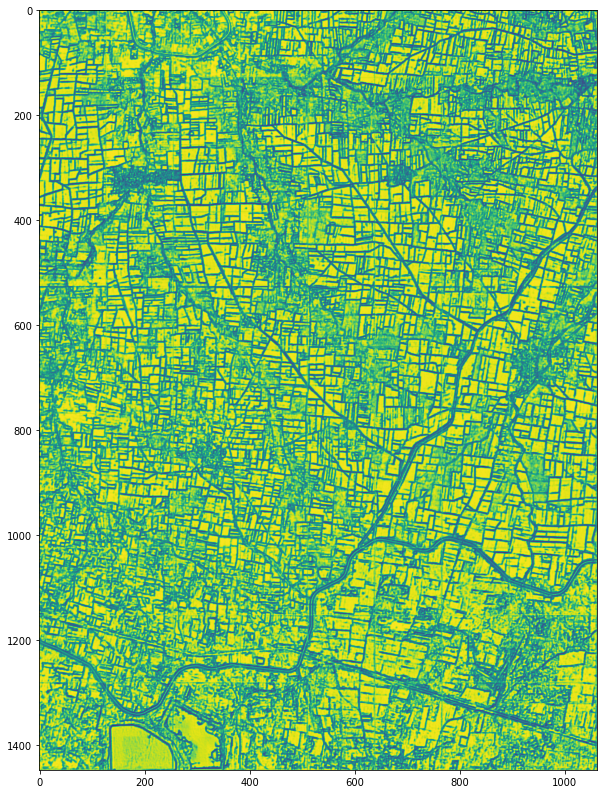

In [50]:
import matplotlib.pyplot as plt
pyplot.figure(figsize=(10, 15))
plt.imshow(recon_img_extent_logits)

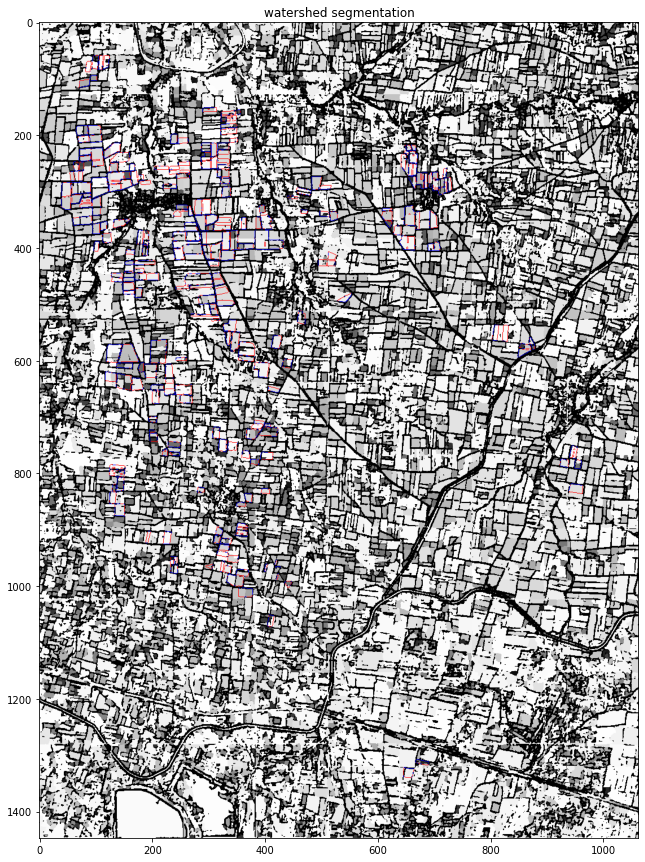

In [54]:
T_EXT = 0.75
T_BOUND = 0.1
def watershed_segmentation(y_pred_extent, y_pred_boundary):
    # Threshold extent mask
    ext_binary = np.uint8(y_pred_extent >= T_EXT)

    # Artificially create strong boundaries for
    # pixels with non-field labels
    input_hws = np.copy(y_pred_boundary)
    input_hws[ext_binary == 0] = 1

    # Create the directed graph
    size = input_hws.shape[:2]
    graph = hg.get_8_adjacency_graph(size)
    edge_weights = hg.weight_graph(
        graph,
        input_hws,
        hg.WeightFunction.mean)

    tree, altitudes = hg.watershed_hierarchy_by_dynamics(
        graph,
        edge_weights)

    # Get individual fields
    # by cutting the graph using altitude
    instances = hg.labelisation_horizontal_cut_from_threshold(
        tree,
        altitudes,
        threshold=T_BOUND).astype('float32')

    instances[ext_binary == 0] = np.nan
    return instances
instances = watershed_segmentation(recon_img_extent_logits, 
                                   recon_img_bound_logits)

instances = np.nan_to_num(instances)
instances = normalize_watershed(np.expand_dims(instances, axis=2))
instances = cv2.cvtColor(instances, cv2.COLOR_GRAY2RGB)
visualize_segmentation_w_bound(instances, labels[key]['bound'])


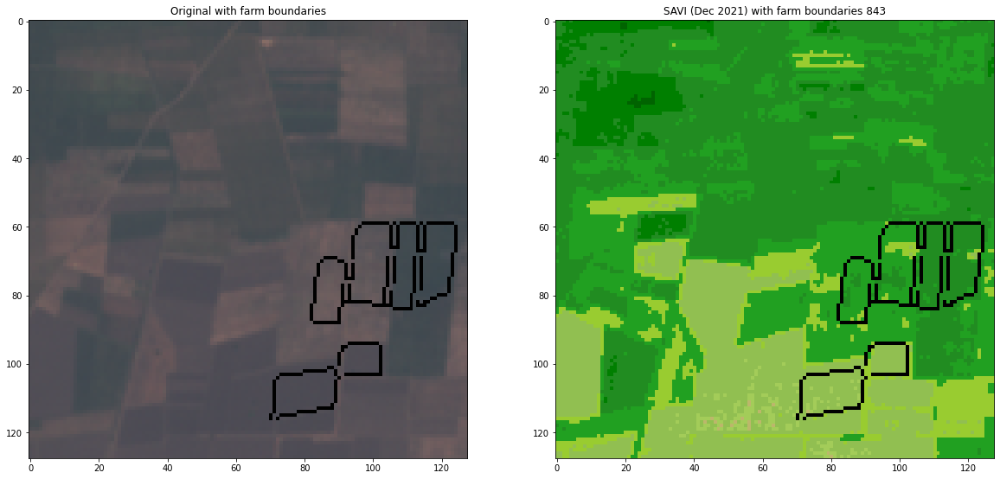

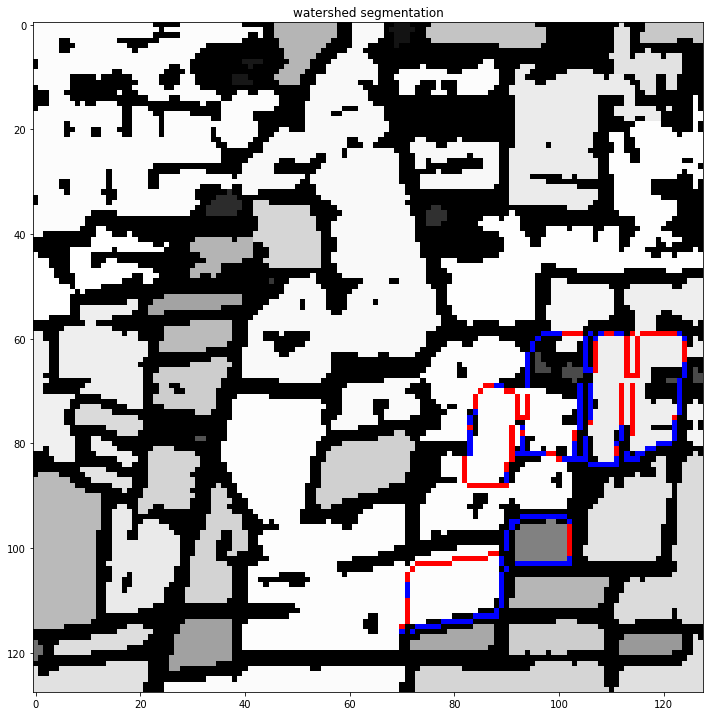

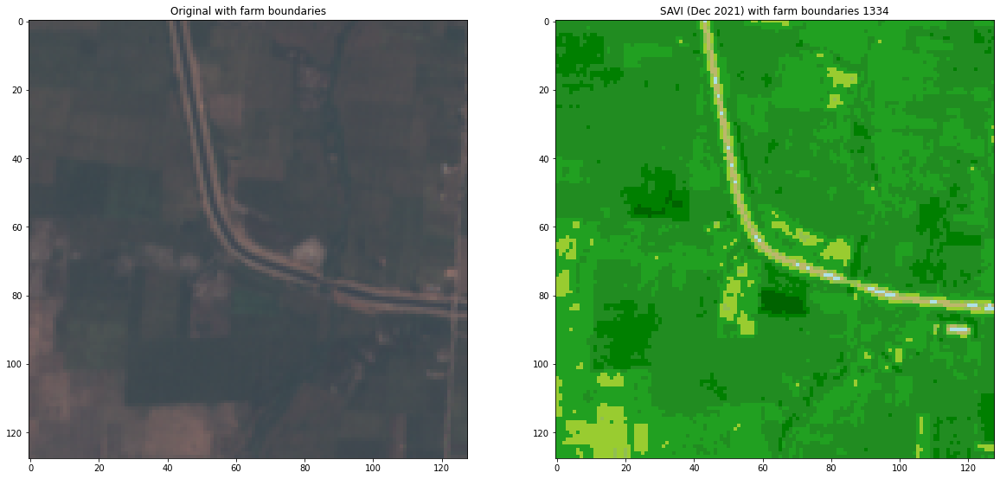

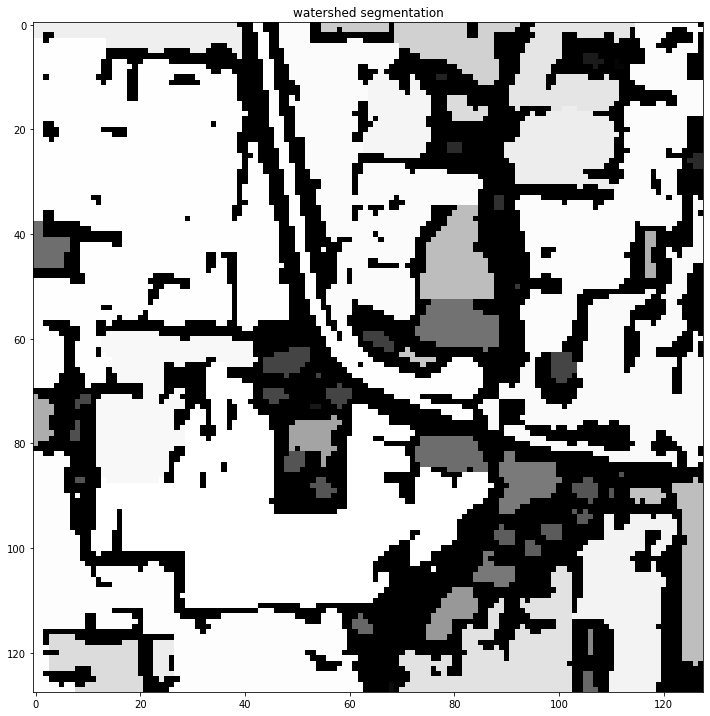

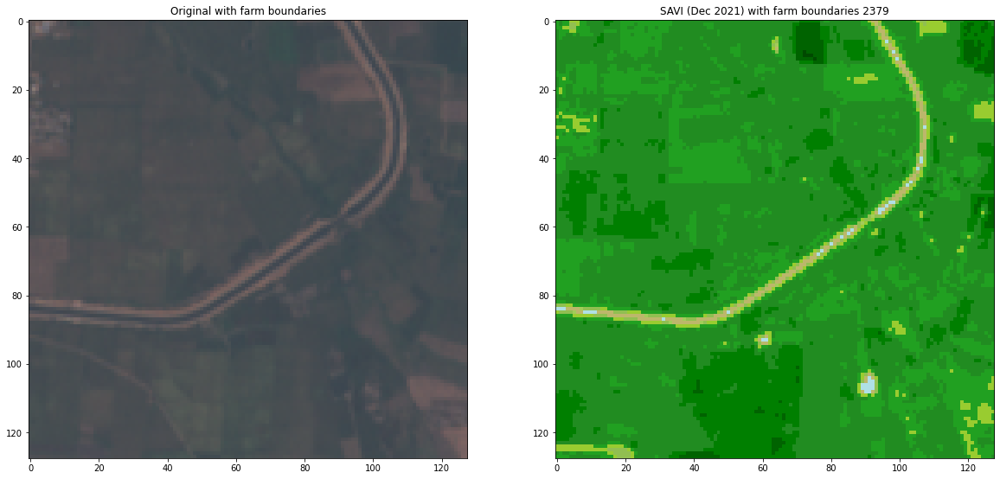

...

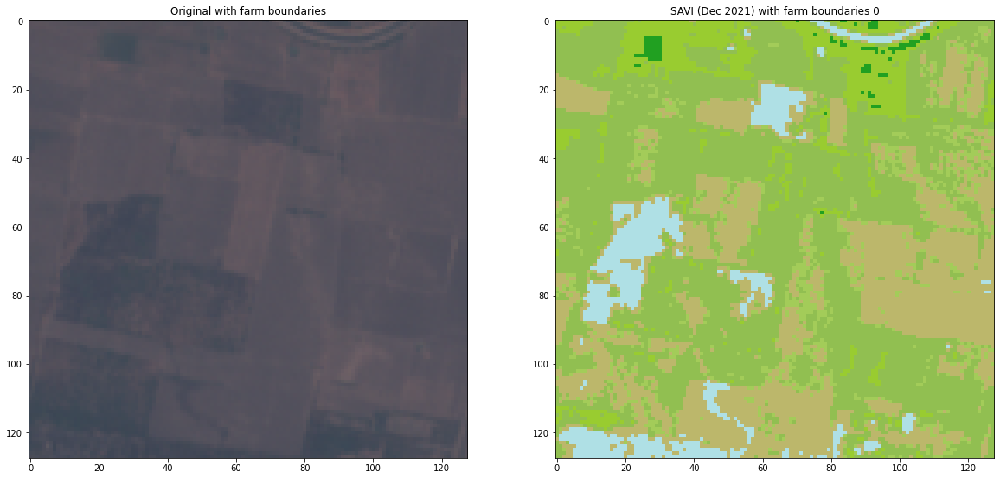

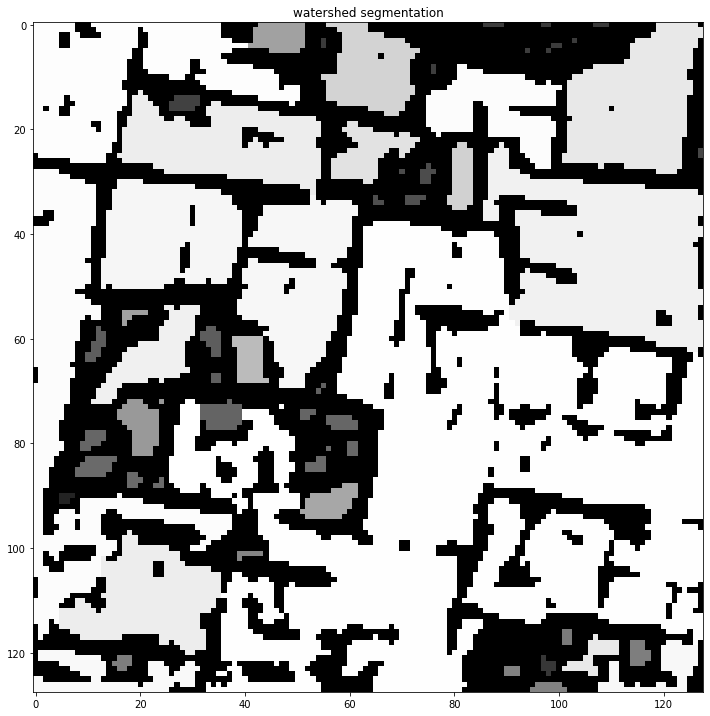

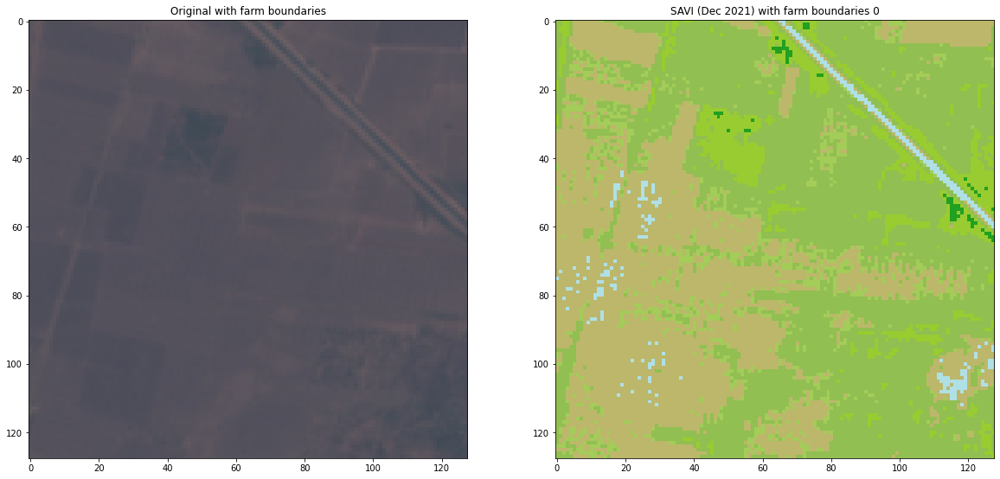

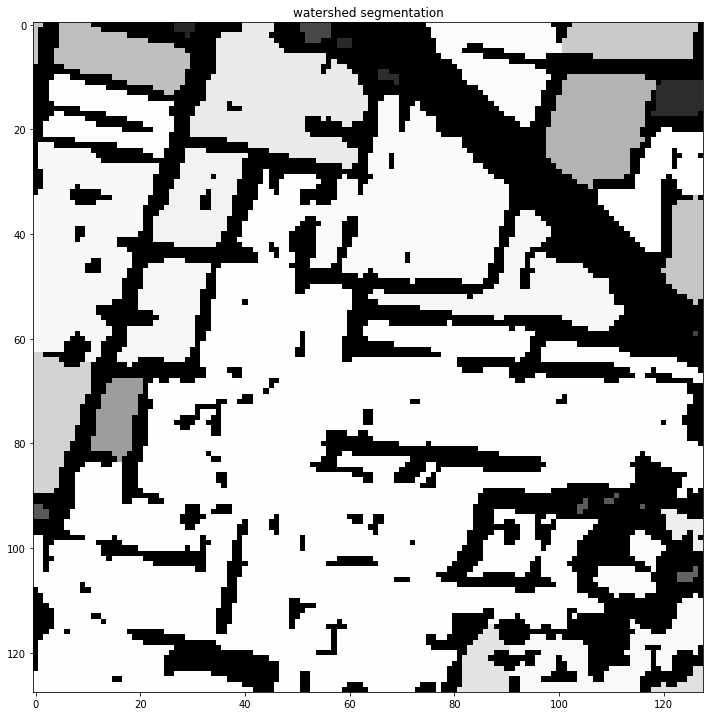

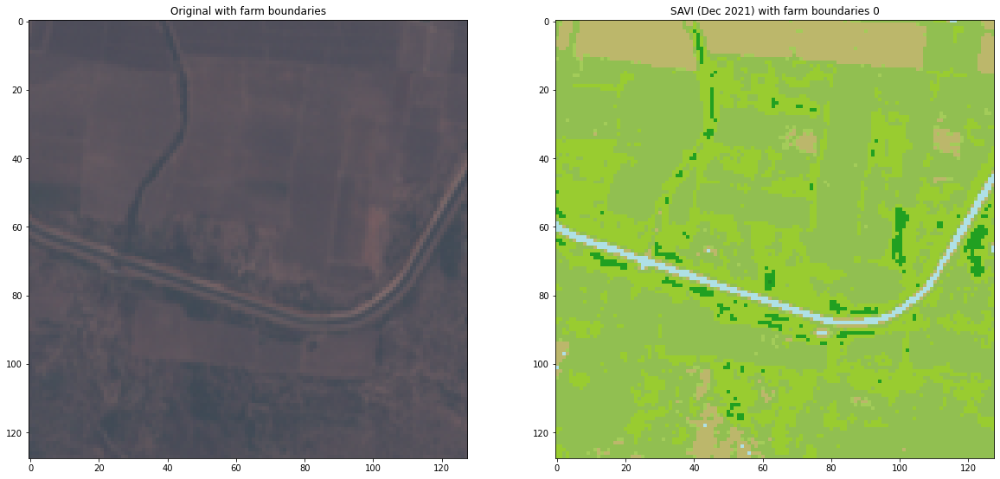

KeyboardInterrupt: ignored

In [265]:
x = images[key].shape[0] // PATCHSIZE
y = images[key].shape[1] // PATCHSIZE

if images[key].shape[0]%PATCHSIZE != 0:
    x += 1 # number of rows
if images[key].shape[1]%PATCHSIZE != 0:
    y += 1 # number of cols

recon_img_extent = np.zeros((images[key].shape[0], images[key].shape[1], 2), dtype='uint8')
recon_img_bound = np.zeros((images[key].shape[0], images[key].shape[1], 2), dtype='uint8')
recon_img_dist = np.zeros((images[key].shape[0], images[key].shape[1], 2), dtype='float32')

recon_img_extent_logits = np.zeros((images[key].shape[0], images[key].shape[1]), dtype='float32')
recon_img_bound_logits = np.zeros((images[key].shape[0], images[key].shape[1]), dtype='float32')

for row in range(x):
    srow = row*PATCHSIZE
    erow = (row+1)*PATCHSIZE
    if erow >= images[key].shape[0]:
        erow = images[key].shape[0]
        srow = erow-PATCHSIZE
    for col in range(y):
        scol = col*PATCHSIZE
        ecol = (col+1)*PATCHSIZE
        if ecol >= images[key].shape[1]:
            ecol = images[key].shape[1]
            scol = ecol-PATCHSIZE
        # create patch, expand the dimension and add it to the samples
            
        patch = images[key][srow : erow, scol : ecol, :].copy()
        patch = patch.transpose(2,0,1)
        patch = np.expand_dims(patch, axis=0)
            
        # pred_patch = model.predict(patch)
        patch1=mx.nd.array(patch, context)
        pred_patch= model(patch1)

        # recon_img_extent[srow:erow, scol:ecol,1] = np.argmax(pred_patch['extent'][0], axis=2) + 1
        # recon_img_bound[srow:erow, scol:ecol, 1] = np.argmax(pred_patch['bound'][0], axis=2) + 1
        # recon_img_dist[srow:erow, scol:ecol, 1] = pred_patch['dist'][0][:,:,1]

        # recon_img_extent_logits[srow:erow, scol:ecol] = pred_patch['extent'][0][:,:,1]
        # recon_img_bound_logits[srow:erow, scol:ecol] = pred_patch['bound'][0][:,:,1]

        recon_img_extent[srow:erow, scol:ecol,1] = np.argmax(pred_patch[0][0], axis=0).asnumpy()
        recon_img_bound[srow:erow, scol:ecol, 1] = np.argmax(pred_patch[1][0], axis=0).asnumpy()
        recon_img_dist[srow:erow, scol:ecol, 1] = pred_patch[2][0][0,:,:].asnumpy()

        recon_img_extent_logits[srow:erow, scol:ecol] = pred_patch[0][0][1,:,:].asnumpy()
        recon_img_bound_logits[srow:erow, scol:ecol] = pred_patch[1][0][1,:,:].asnumpy()
        
#         print(np.squeeze(patch, axis=0).shape, labels[key]['bound'][srow:erow, scol:ecol,:].shape)

        visualize_patch_w_savi(np.squeeze(patch,axis=0), labels[key]['bound'][srow:erow, scol:ecol,:])
  
        instances = watershed_segmentation(recon_img_extent_logits[srow:erow, scol:ecol], 
                                           recon_img_bound_logits[srow:erow, scol:ecol])
    

        instances = np.nan_to_num(instances)
        instances = normalize_watershed(np.expand_dims(instances, axis=2))
        instances = cv2.cvtColor(instances, cv2.COLOR_GRAY2RGB)
        visualize_segmentation_w_bound(instances, labels[key]['bound'][srow:erow, scol:ecol,:])
